# Tutorial: Gene expression amplification in super resolution Xenium dataset

Here we focus on the gene expression signal enhancement in super-resolution but noisy ST data like Xenium. Human Breast Cancer data replicate 1 is used here. The dataset can be downloaded from [10X Genomics](https://www.10xgenomics.com/products/xenium-in-situ/preview-dataset-human-breast).\
We have also created a h5ad data for loading convenience, which can be downloaded from the [Google Drive](https://drive.google.com/file/d/15dQe9J0hikh-wiTF3h4ON0FKFA8cBzZA/view?usp=drive_link).

## Preparation

### import library

In [1]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
import gzip
from scipy.io import mmread
import HERGAST
plt.rcParams["figure.figsize"] = (15, 10)

### read data

In [2]:
data_path = 'data' #replace to your own path
adata = sc.read_h5ad(f'{data_path}/Xenium_HumanBC_raw.h5ad')
adata

AnnData object with n_obs × n_vars = 167780 × 313
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area'
    var: 'ensemble_id', 'type'
    obsm: 'spatial'

### Preprocess

In [3]:
adata.raw = adata.copy()
sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=adata.shape[1])
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

## Constructing relational graph

In [4]:
HERGAST.utils.Cal_Spatial_Net(adata, k_cutoff=8)
HERGAST.utils.Cal_Expression_Net(adata,dim_reduce='HVG', k_cutoff=6)

------Calculating spatial graph...
Spatial graph contains 1342240 edges, 167780 cells.
8.0000 neighbors per cell on average.
------Calculating Expression simalarity graph...
Expression graph contains 1032430 edges, 167780 cells.
6.1535 neighbors per cell on average.


## Running HERGAST

In [5]:
train_HERGAST = HERGAST.Train_HERGAST(adata, batch_data=True, num_batch_x_y=(5,4), spatial_net_arg={'k_cutoff':8,'verbose':False},
                                  exp_net_arg={'k_cutoff':6,'verbose':False},dim_reduction='HVG',device_idx=0)

Size of Input:  torch.Size([167780, 313])


In [6]:
train_HERGAST.train_HERGAST(n_epochs=200,save_reconstrction=True)

100%|██████████| 200/200 [16:18<00:00,  4.89s/it]


## Spatial clustering

In [9]:
sc.pp.neighbors(adata, use_rep='HERGAST')
sc.tl.leiden(adata, random_state=2024, resolution=0.3)

(-7899.134582691193, 373.91520135879523, -272.3777922907472, 5750.011061165631)

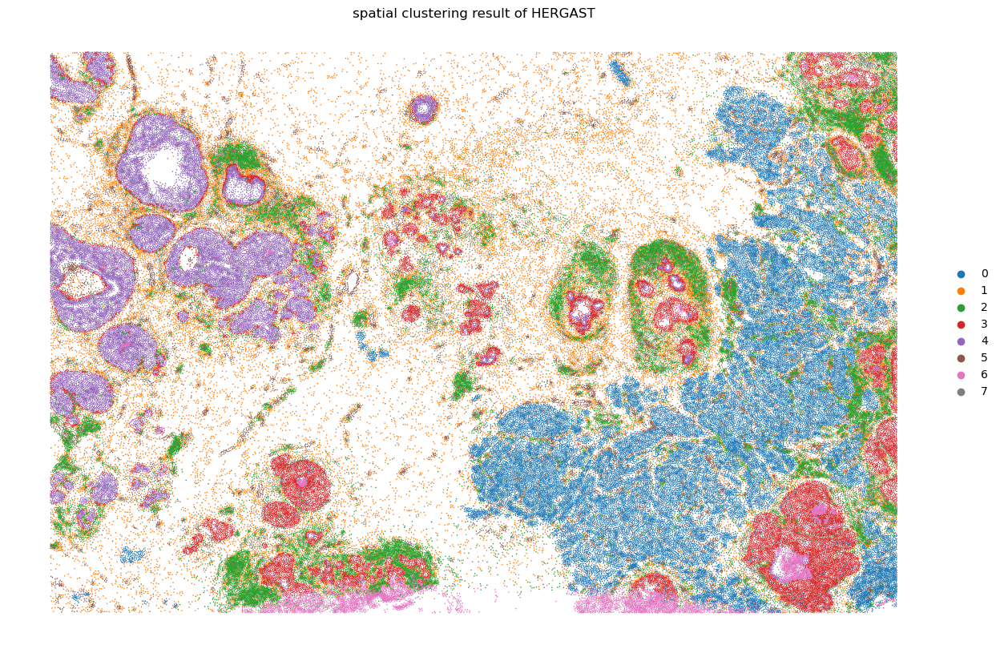

In [11]:
sc.pl.embedding(adata, basis="spatial",show=False, s=5, color='leiden',title='spatial clustering result of HERGAST')
plt.axis('off')

## Gene expression amplification

In [12]:
adata.layers['rex'] = adata.obsm['HERGAST_ReX']

### before enhancing

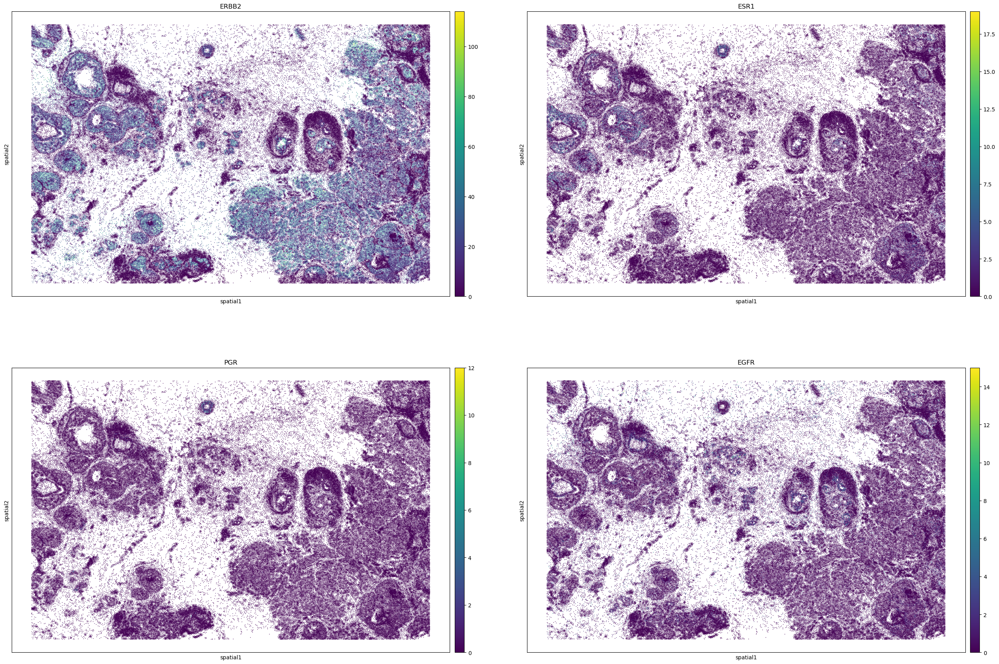

In [13]:
sc.pl.embedding(adata, basis="spatial",s=5, color=['ERBB2','ESR1','PGR','EGFR'], ncols=2)

### after enhancing

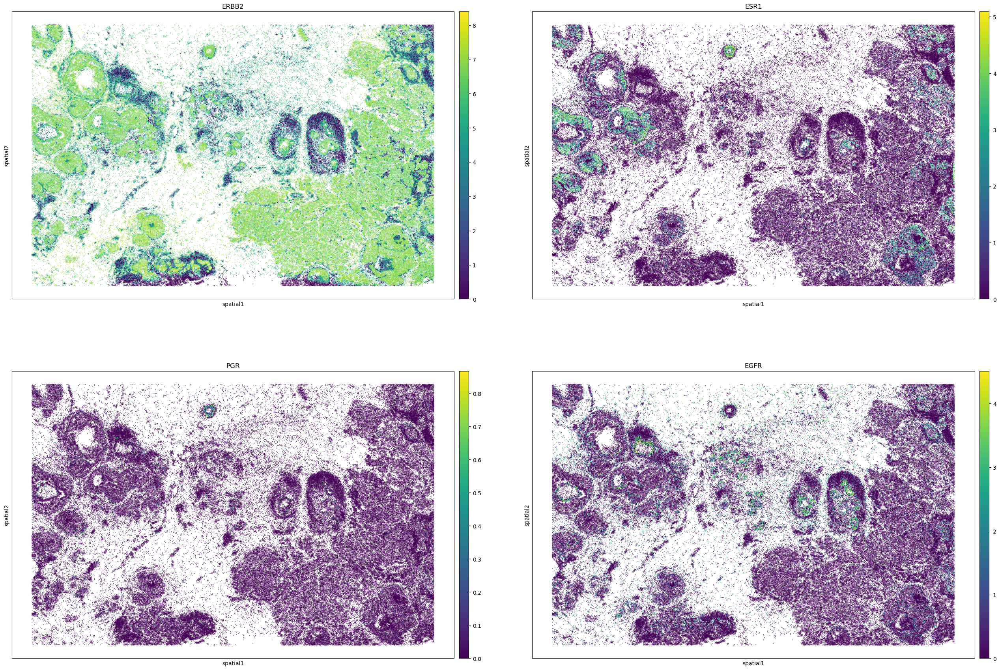

In [14]:
sc.pl.embedding(adata, basis="spatial",s=5, color=['ERBB2','ESR1','PGR','EGFR'], layer='rex',ncols=2)